In [1]:
!pip install -q qqdm

import random 
import torch 
import numpy as np
import os 
import glob 
import torch.nn as nn
import torch.nn.functional as F
import torchvision 
import torchvision.transforms as transforms
import matplotlib.pyplot as plt 

from torch import optim 
from torch.autograd import Variable
from torch.utils.data import Dataset, DataLoader, Subset
from qqdm.notebook import qqdm

In [2]:
def same_seeds(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True
same_seeds(2023)

In [3]:
class CrypkoDataset(Dataset):
    def __init__(self, fnames, transform):
        self.transform = transform
        self.fnames = fnames 
        self.num_samples = len(self.fnames)
        
    def __getitem__(self, idx):
        fname = self.fnames[idx]
        img = torchvision.io.read_image(fname)
        img = self.transform(img)
        return img 
    
    def __len__(self):
        return self.num_samples
    
def get_dataset(root):
    fnames = glob.glob(os.path.join(root, '*'))
    compose = [
        transforms.ToPILImage(),
        transforms.Resize((64, 64)),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
    ]
    transform = transforms.Compose(compose)
    dataset = CrypkoDataset(fnames, transform)
    return dataset

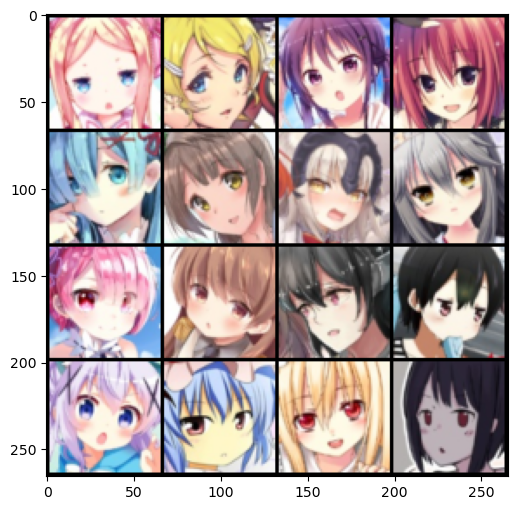

In [4]:
dataset = get_dataset(os.path.join('../input', 'crypko-data', 'faces'))

# indices = np.arange(300)
# dataset = Subset(dataset, indices)
# print(len(dataset))

images = [(dataset[i] + 1) / 2 for i in range(16)]
grid_img = torchvision.utils.make_grid(images, nrow=4)
plt.figure(figsize=(6, 6))
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()

In [5]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)
        
class Generator(nn.Module):
    
    # Input shape: (N, in_dim)
    # Output shape: (N, 3, 64, 64)
    
    def __init__(self, in_dim, dim=64):
        super(Generator, self).__init__()
        def dconv_bn_relu(in_dim, out_dim):
            return nn.Sequential(
                nn.ConvTranspose2d(in_dim, out_dim, 5, 2, padding=2, output_padding=1, bias=False),
                nn.BatchNorm2d(out_dim),
                nn.ReLU()
            )
        self.l1 = nn.Sequential(
            nn.Linear(in_dim, dim * 8 * 4 * 4, bias=False),
            nn.BatchNorm1d(dim * 8 * 4 * 4),
            nn.ReLU()
        )
        self.l2_5 = nn.Sequential(
            dconv_bn_relu(dim * 8, dim * 4),
            dconv_bn_relu(dim * 4, dim * 2),
            dconv_bn_relu(dim * 2, dim),
            nn.ConvTranspose2d(dim, 3, 5, 2, padding=2, output_padding=1),
            nn.Tanh()
        )
        self.apply(weights_init)
        
    def forward(self, x):
        y = self.l1(x)
        y = y.view(y.size(0), -1, 4, 4)
        y = self.l2_5(y)
        return y
    
class Discriminator(nn.Module):
    
    # Input shape: (N, 3, 64, 64)
    # Output shape: (N, )
    
    def __init__(self, in_dim, dim=64):
        super(Discriminator, self).__init__()
        def conv_bn_lrelu(in_dim, out_dim):
            return nn.Sequential(
                nn.Conv2d(in_dim, out_dim, 5, 2, 2),
                nn.BatchNorm2d(out_dim),
                nn.LeakyReLU(0.2)
            )
        self.ls = nn.Sequential(
            nn.Conv2d(in_dim, dim, 5, 2, 2),
            nn.LeakyReLU(0.2),
            conv_bn_lrelu(dim, dim * 2),
            conv_bn_lrelu(dim * 2, dim * 4),
            conv_bn_lrelu(dim * 4, dim * 8),
            nn.Conv2d(dim * 8, 1, 4),
            nn.Sigmoid()
        )
        self.apply(weights_init)
        
    def forward(self, x):
        y = self.ls(x)
        y = y.view(-1)
        return y

In [6]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

batch_size = 64 
z_dim = 100
z_sample = Variable(torch.randn(100, z_dim)).to(device)
lr = 1e-4

n_epoch = 50
n_critic = 5
clip_value = 0.01

log_dir = os.path.join('../working', 'crypko-data', 'logs')
ckpt_dir = os.path.join('../working', 'crypko-data', 'checkpoints')
os.makedirs(log_dir, exist_ok=True)
os.makedirs(ckpt_dir, exist_ok=True)

G = Generator(in_dim=z_dim).to(device)
D = Discriminator(3).to(device)
G.train()
D.train()

criterion = nn.BCELoss()
opt_D = torch.optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.999))
opt_G = torch.optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))

dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2)

   Iters      Elapsed Time      Speed    Loss_D  Loss_G   Epoch  Step           
 1115/1115  00:05:02<00:00:00  3.69it/s  0.0015  10.2813    1    1115           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 01.jpg


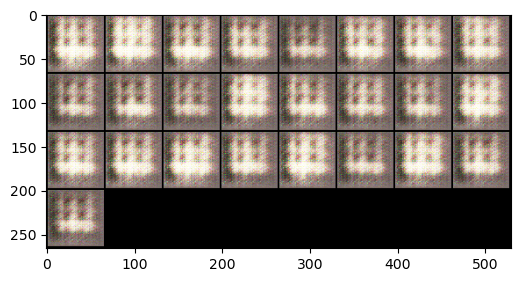

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:16<00:00:00  5.68it/s  0.0012  6.8264    2    2230            

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 02.jpg


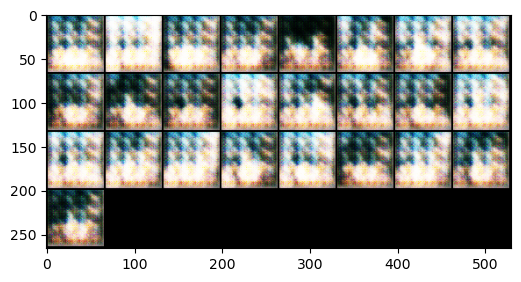

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0288  7.4114    3    3345            

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 03.jpg


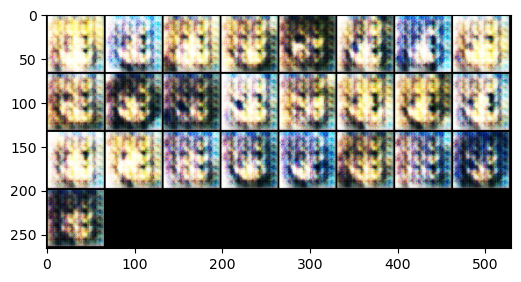

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0025  6.7591    4    4460            

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 04.jpg


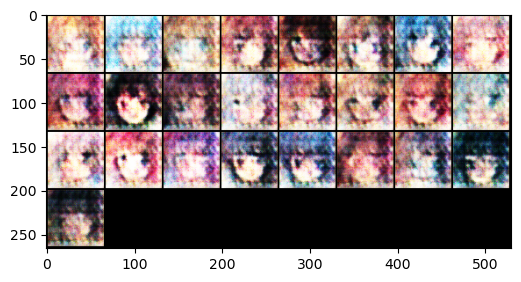

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0441  8.7799    5    5575            

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 05.jpg


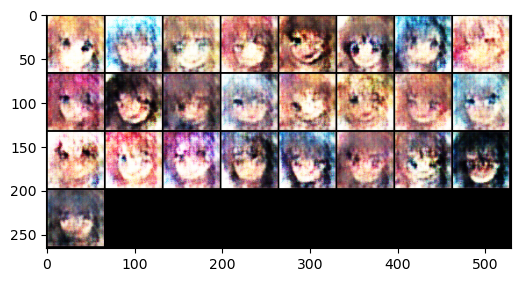

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0058  8.061     6    6690            

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 06.jpg


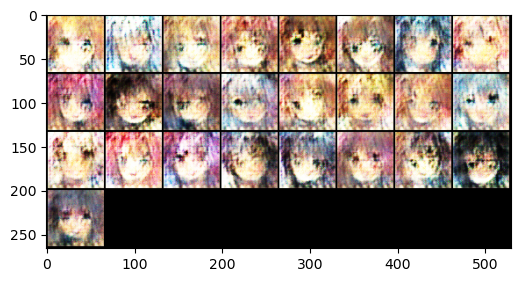

   Iters      Elapsed Time      Speed    Loss_D  Loss_G   Epoch  Step           
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0033  10.6569    7    7805           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 07.jpg


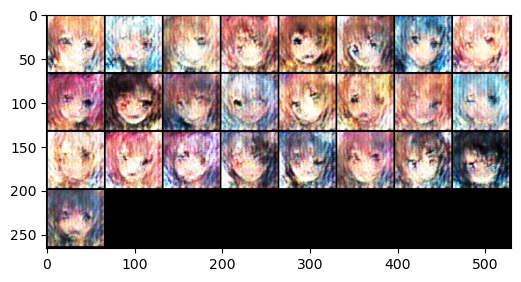

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0013  8.8672    8    8920            

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 08.jpg


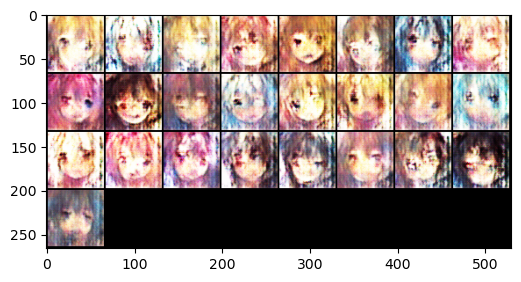

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.71it/s  0.0039  8.3876    9    10035           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 09.jpg


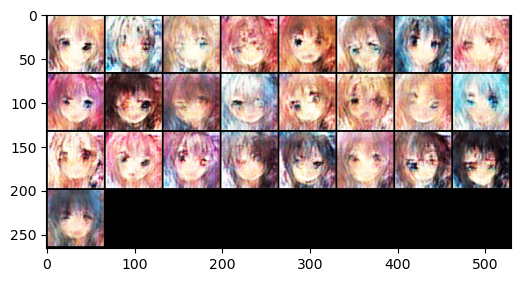

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.69it/s  0.0836  8.9125   10    11150           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 10.jpg


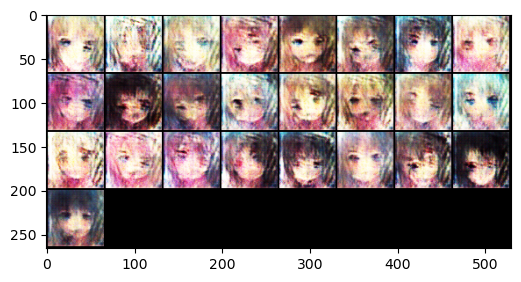

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0094  7.0003   11    12265           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 11.jpg


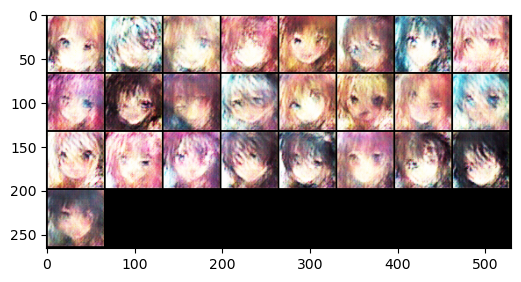

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0018  8.7258   12    13380           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 12.jpg


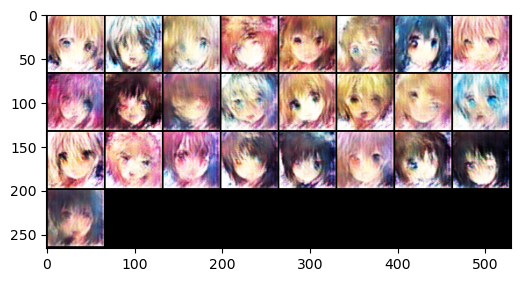

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.71it/s  0.0027  8.2041   13    14495           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 13.jpg


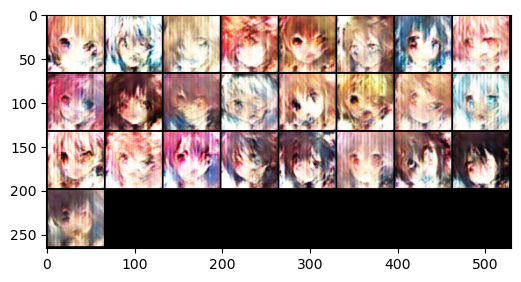

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.074   7.6758   14    15610           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 14.jpg


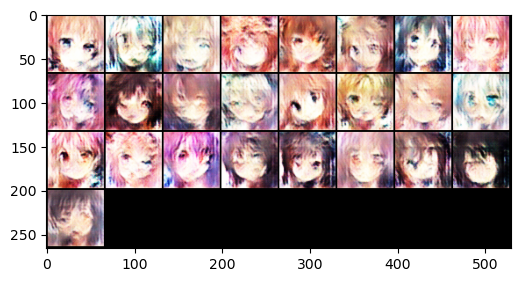

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:16<00:00:00  5.69it/s  0.059   6.344    15    16725           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 15.jpg


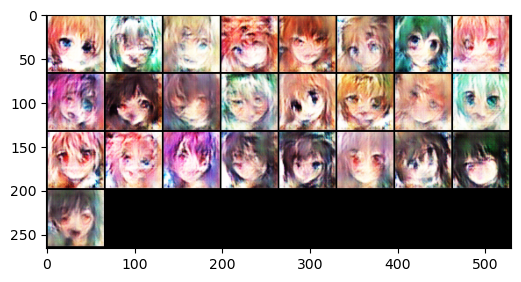

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.71it/s  0.0483  6.0196   16    17840           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 16.jpg


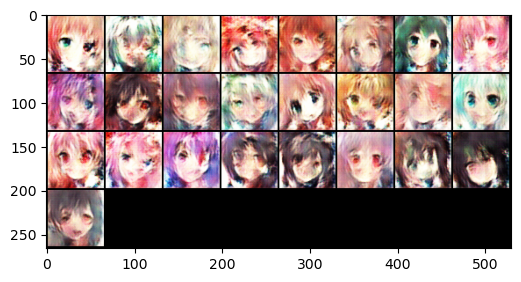

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0026  9.7437   17    18955           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 17.jpg


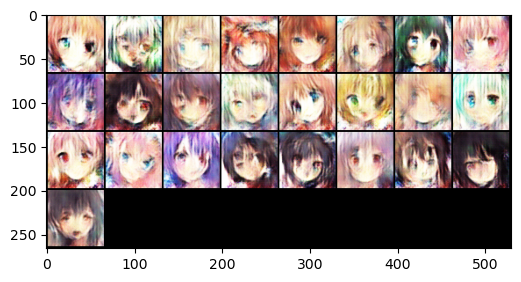

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0041  6.6043   18    20070           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 18.jpg


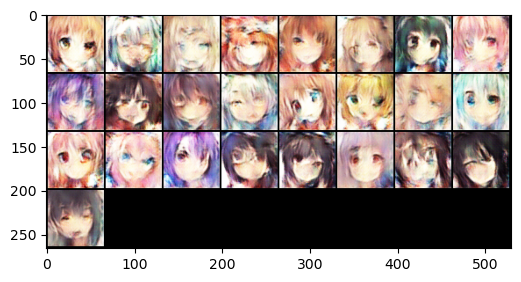

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:16<00:00:00  5.69it/s  0.0085  7.3881   19    21185           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 19.jpg


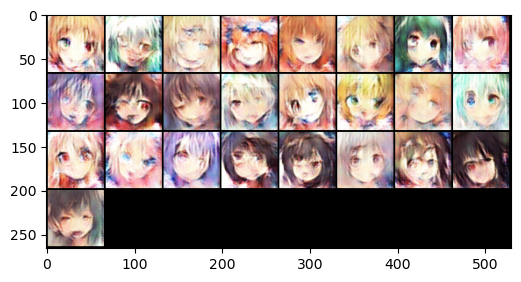

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0088  7.063    20    22300           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 20.jpg


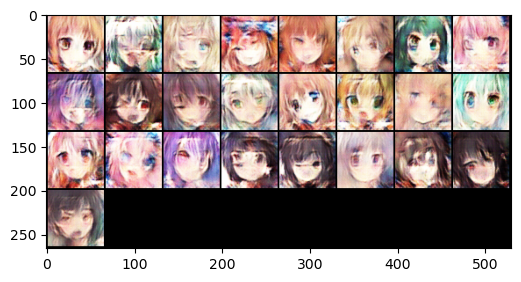

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.71it/s  0.005   6.375    21    23415           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 21.jpg


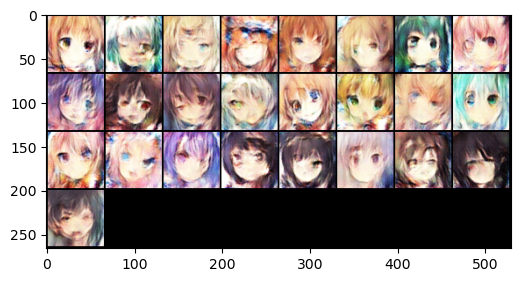

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0043  8.1582   22    24530           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 22.jpg


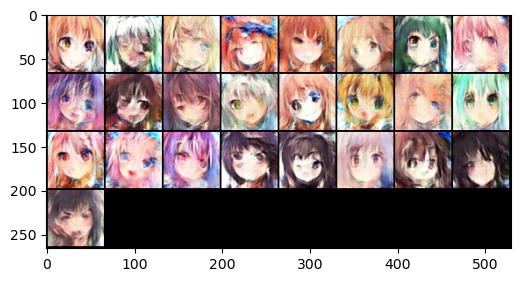

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0157  6.5073   23    25645           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 23.jpg


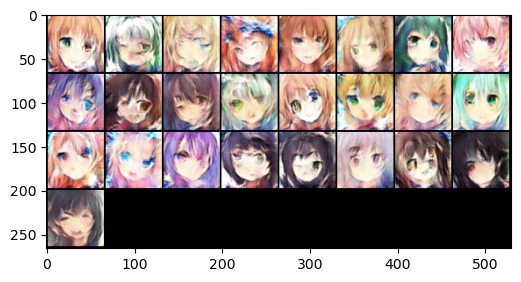

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.71it/s  0.0017  6.7318   24    26760           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 24.jpg


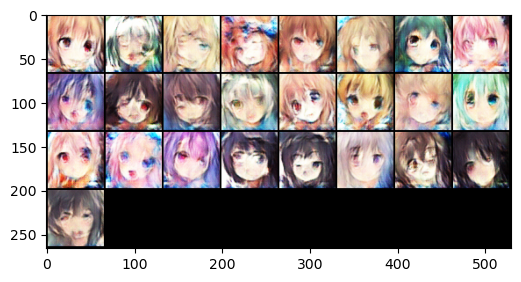

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.71it/s  0.008   6.4177   25    27875           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 25.jpg


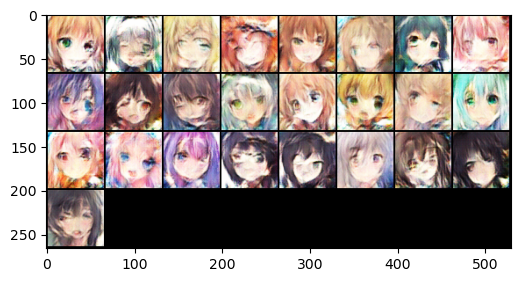

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0084  6.5721   26    28990           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 26.jpg


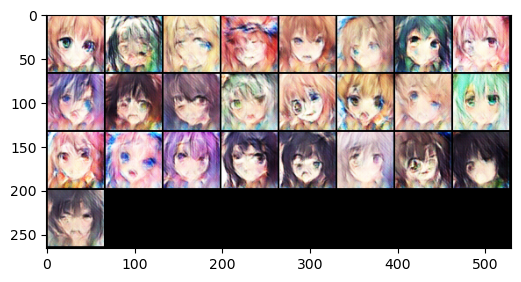

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.71it/s  0.0035  7.4879   27    30105           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 27.jpg


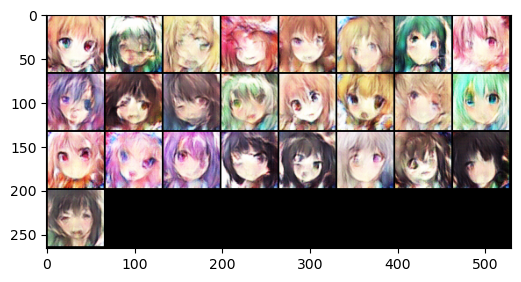

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0306  5.7319   28    31220           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 28.jpg


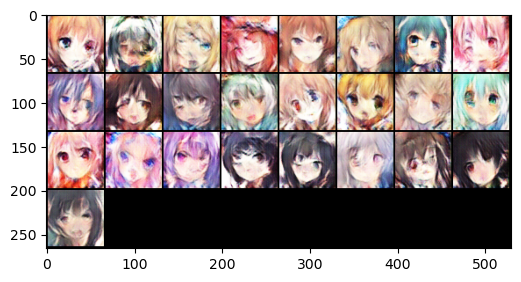

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.71it/s  0.0229  6.5882   29    32335           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 29.jpg


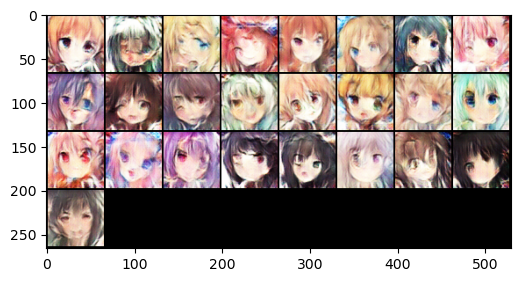

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0308  8.0432   30    33450           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 30.jpg


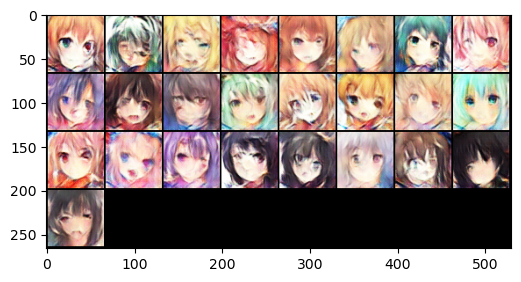

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.71it/s  0.025   6.4184   31    34565           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 31.jpg


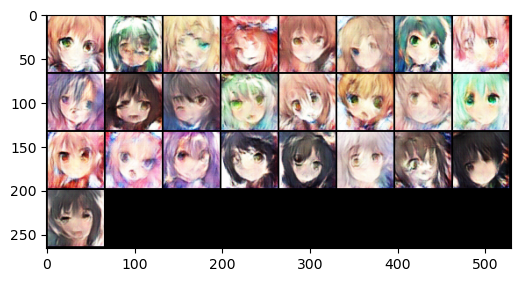

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0439  7.079    32    35680           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 32.jpg


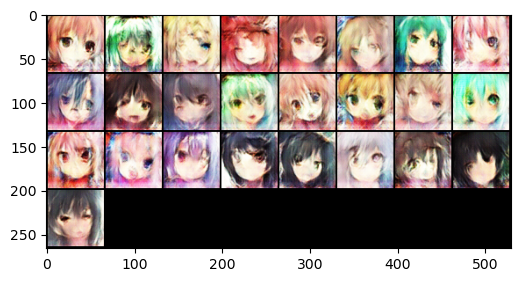

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0089  7.8007   33    36795           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 33.jpg


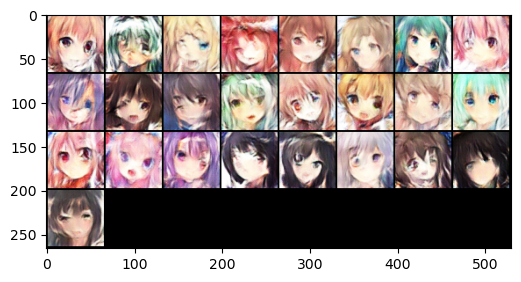

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.71it/s  0.0021  7.8518   34    37910           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 34.jpg


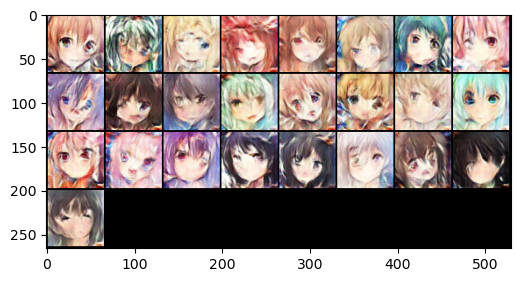

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0256  5.2076   35    39025           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 35.jpg


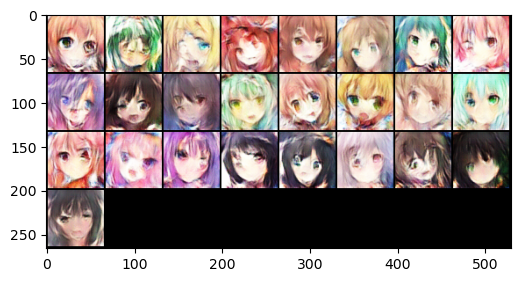

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0351  5.8566   36    40140           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 36.jpg


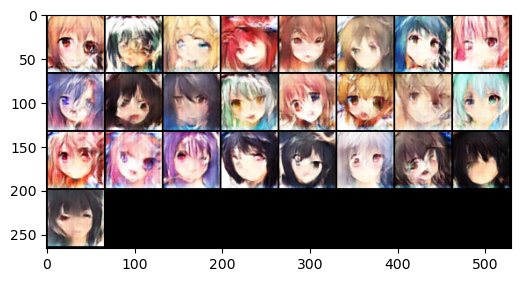

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.71it/s  0.0016  7.5892   37    41255           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 37.jpg


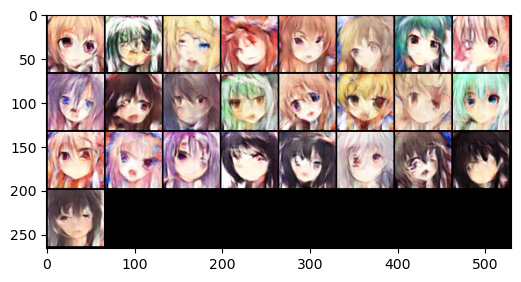

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.71it/s  0.0213  7.1895   38    42370           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 38.jpg


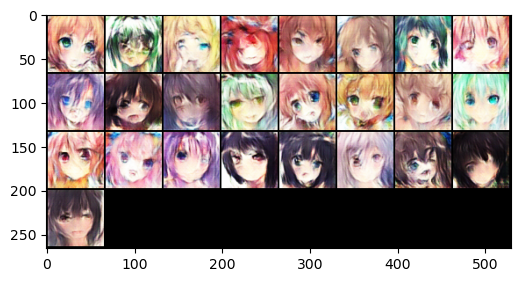

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.71it/s  0.0087  7.424    39    43485           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 39.jpg


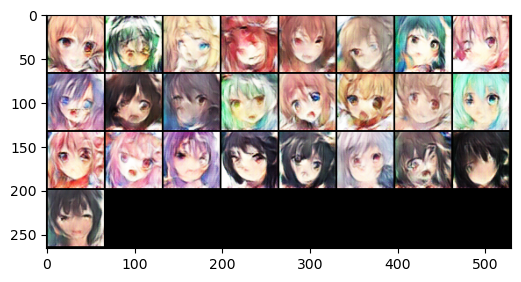

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0044  6.6561   40    44600           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 40.jpg


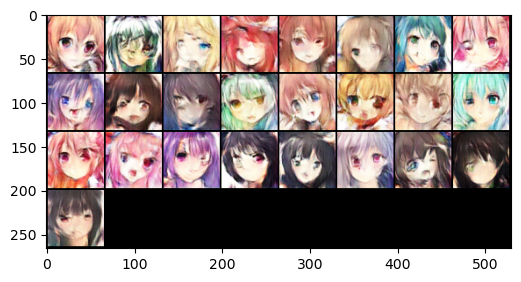

   Iters      Elapsed Time      Speed    Loss_D  Loss_G   Epoch  Step           
 1115/1115  00:03:15<00:00:00  5.71it/s  0.0342  10.2322   41    45715          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 41.jpg


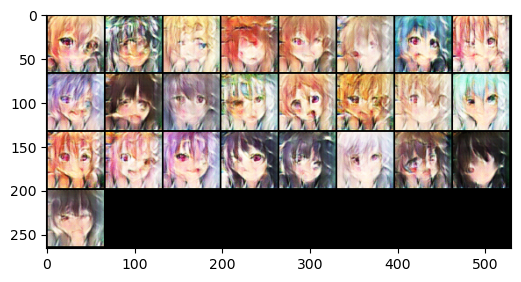

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.71it/s  0.0046  9.9797   42    46830           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 42.jpg


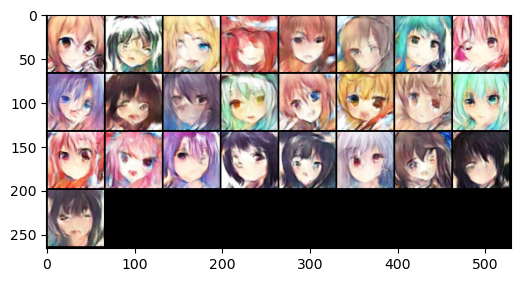

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.71it/s  0.021   8.2917   43    47945           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 43.jpg


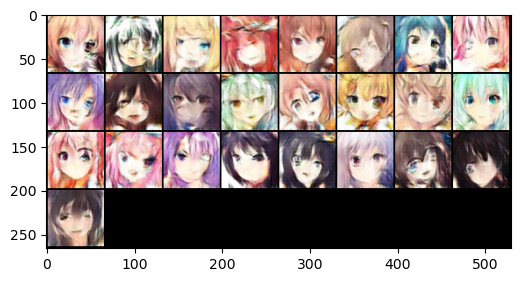

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.71it/s  0.0038  6.6812   44    49060           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 44.jpg


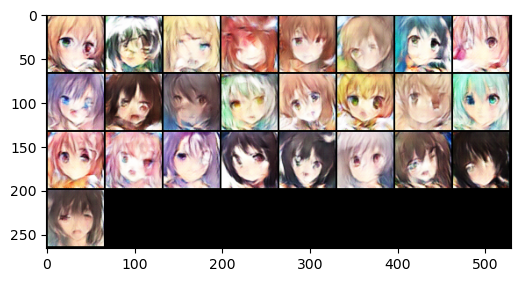

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.003   6.4879   45    50175           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 45.jpg


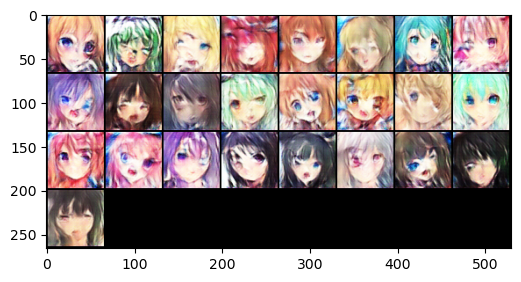

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.70it/s  0.0134  5.8374   46    51290           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 46.jpg


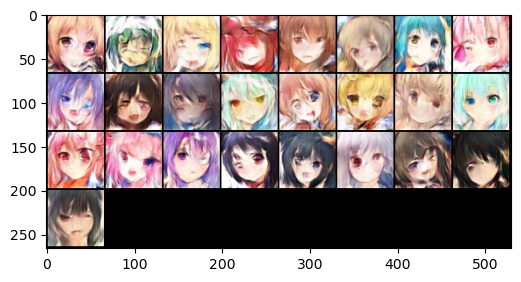

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.71it/s  0.0004  9.242    47    52405           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 47.jpg


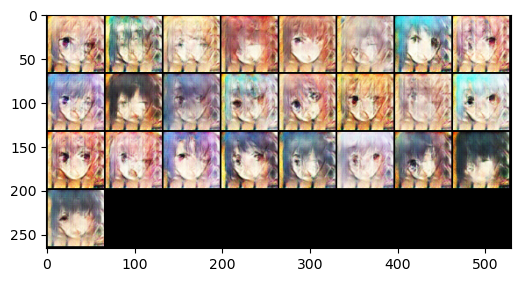

   Iters      Elapsed Time      Speed    Loss_D  Loss_G   Epoch  Step           
 1115/1115  00:03:15<00:00:00  5.70it/s   0.0    52.6012   48    53520          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 48.jpg


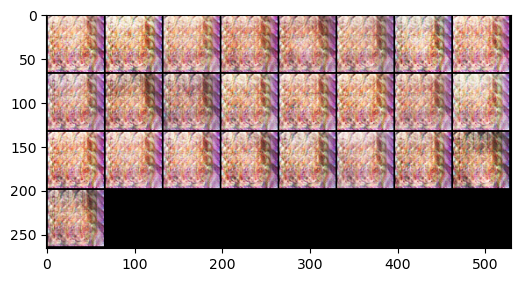

   Iters      Elapsed Time      Speed    Loss_D  Loss_G   Epoch  Step           
 1115/1115  00:03:15<00:00:00  5.69it/s   0.0    52.3388   49    54635          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 49.jpg


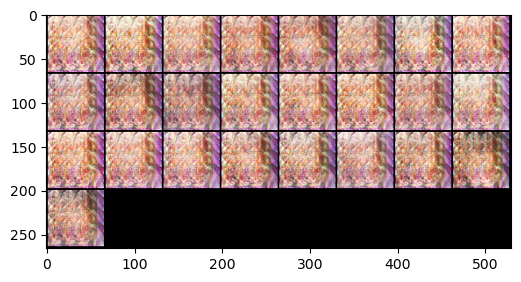

   Iters      Elapsed Time      Speed    Loss_D  Loss_G  Epoch  Step            
 1115/1115  00:03:15<00:00:00  5.72it/s   0.0    52.225   50    55750           

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

 Save some samples to ../working/crypko-data/logs/Epoch_ 50.jpg


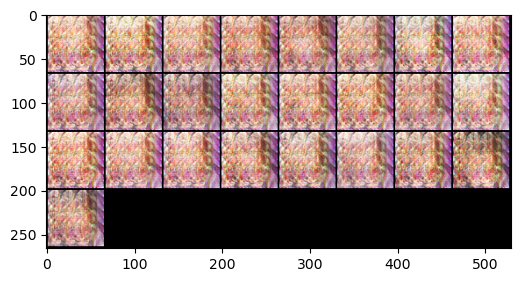

In [7]:
steps = 0
for e, epoch in enumerate(range(n_epoch)):
    progress_bar = qqdm(dataloader)
    for i, data in enumerate(progress_bar):
        imgs = data
        imgs = imgs.to(device)
        
        bs = imgs.size(0)
        
        z = Variable(torch.randn(bs, z_dim)).to(device)
        r_imgs = Variable(imgs).to(device)
        f_imgs = G(z)
        
        r_label = torch.ones((bs)).to(device)
        f_label = torch.zeros((bs)).to(device)
        r_logit = D(r_imgs.detach())
        f_logit = D(f_imgs.detach())
        r_loss = criterion(r_logit, r_label)
        f_loss = criterion(f_logit, f_label)
        loss_D = (r_loss + f_loss) / 2
        
        D.zero_grad()
        loss_D.backward()
        opt_D.step()
        
        if steps % n_critic == 0:
            z = Variable(torch.randn(bs, z_dim)).to(device)
            f_imgs = G(z)
            f_logit = D(f_imgs)
            loss_G = criterion(f_logit, r_label)
            
            G.zero_grad()
            loss_G.backward()
            opt_G.step()
        
        steps += 1
        
        progress_bar.set_infos({
            'Loss_D': round(loss_D.item(), 4),
            'Loss_G': round(loss_G.item(), 4),
            'Epoch': e + 1,
            'Step': steps
        })
        
    G.eval()
    f_imgs_sample = (G(z_sample).data + 1) / 2.0
    filename = os.path.join(log_dir, f'Epoch_{epoch + 1: 03d}.jpg')
    torchvision.utils.save_image(f_imgs_sample, filename, nrows=10)
    print(f' Save some samples to {filename}')
    
    grid_img = torchvision.utils.make_grid(f_imgs_sample[:25].cpu(), nrows=5)
    plt.figure(figsize=(6, 6))
    plt.imshow(grid_img.permute(1, 2, 0))
    plt.show()
    G.train()
    
    if (e + 1) % 5 == 0 or e == 0:
        torch.save(G.state_dict(), os.path.join(ckpt_dir, 'G.pth'))
        torch.save(D.state_dict(), os.path.join(ckpt_dir, 'D.pth'))

In [8]:
G = Generator(z_dim)
G.load_state_dict(torch.load(os.path.join(ckpt_dir, 'G.pth')))
G.eval()
G.to(device)

Generator(
  (l1): Sequential(
    (0): Linear(in_features=100, out_features=8192, bias=False)
    (1): BatchNorm1d(8192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (l2_5): Sequential(
    (0): Sequential(
      (0): ConvTranspose2d(512, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (1): Sequential(
      (0): ConvTranspose2d(256, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (2): Sequential(
      (0): ConvTranspose2d(128, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()


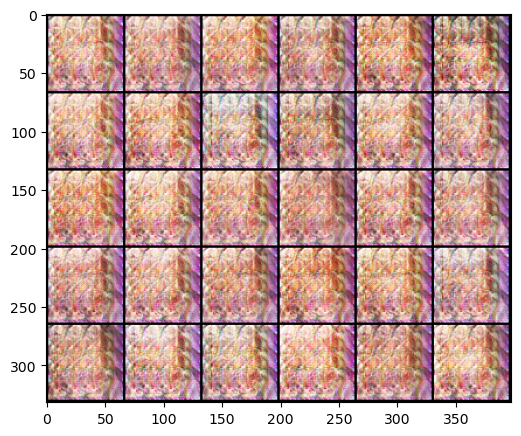

In [9]:
n_output = 100
z_sample = Variable(torch.randn(n_output, z_dim)).to(device)
imgs_sample = (G(z_sample) + 1) / 2.0
log_dir = os.path.join('../working', 'crypko-data', 'logs')
filename = os.path.join(log_dir, 'result.jpg')
torchvision.utils.save_image(imgs_sample, filename, nrow=10)

grid_img = torchvision.utils.make_grid(imgs_sample[:30].cpu(), nrow=6)
plt.figure(figsize=(6, 6))
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()